# Analysis Pipeline — Stanford Cars / SHViT vs Baselines

Runs the full analysis after all 6 models are trained. Everything stays on
Colab's local SSD (`/content/`) for fast iteration; final artifacts are
mirrored into `<OUT_ROOT>/Stage 4: Benchmarking and Demo/analysis/` (and
optionally to Drive) so the project root layout matches the rest of the
experiment.

Default `OUT_ROOT` is `/content/CV_Research_Paper_StanfordCars` (or
`/content/drive/MyDrive/CV_Research_Paper_StanfordCars` when Drive is mounted).


## 0. GPU check

In [1]:
import torch
print('PyTorch :', torch.__version__)
print('CUDA    :', torch.cuda.is_available())
if torch.cuda.is_available():
    print('GPU     :', torch.cuda.get_device_name(0))

PyTorch : 2.11.0+cu128
CUDA    : True
GPU     : NVIDIA A100-SXM4-40GB


## 1. Mount Drive (read-only access to checkpoints + dataset source)


In [2]:
from google.colab import drive
drive.mount('/content/drive')

# Source paths on Drive (where Stage 2 + Stage 3 saved checkpoints and dataset)
DRIVE_OUT_ROOT      = '/content/drive/MyDrive/CV_Research_Paper_StanfordCars'
DRIVE_DATA          = '/content/drive/MyDrive/stanford_cars_data'

# Mirror the same layout locally under CV_Research_Paper_StanfordCars/.
OUT_ROOT            = '/content/CV_Research_Paper_StanfordCars'
ANALYSIS_ROOT       = f'{OUT_ROOT}/Stage 4: Benchmarking and Demo/analysis'

LOCAL_DATA          = '/content/stanford_cars_local'  # large(-ish), kept separate
LOCAL_CHECKPOINTS   = OUT_ROOT
LOCAL_RESULTS       = f'{ANALYSIS_ROOT}/results'
LOCAL_FIGURES       = f'{ANALYSIS_ROOT}/figures'
LOCAL_EDA           = f'{ANALYSIS_ROOT}/eda_outputs'
LOCAL_ERROR         = f'{ANALYSIS_ROOT}/error_analysis_outputs'
LOCAL_DEMO          = f'{ANALYSIS_ROOT}/demo_output'

import os
for p in [ANALYSIS_ROOT, LOCAL_RESULTS, LOCAL_FIGURES,
          LOCAL_EDA, LOCAL_ERROR, LOCAL_DEMO]:
    os.makedirs(p, exist_ok=True)

print('Output root        :', OUT_ROOT)
print('Local analysis root:', ANALYSIS_ROOT)


Mounted at /content/drive
Output root        : /content/CV_Research_Paper_StanfordCars
Local analysis root: /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis


## 2. Copy dataset to local SSD

If `/content/stanford_cars_local` already exists from an earlier session, this skips the copy.


In [3]:
import shutil, time

if not os.path.exists(LOCAL_DATA):
    if os.path.isdir(DRIVE_DATA):
        print('Copying Stanford Cars from Drive to local SSD...')
        t0 = time.time()
        shutil.copytree(DRIVE_DATA, LOCAL_DATA)
        print(f'Done in {time.time()-t0:.0f}s')
    else:
        # No cached copy in Drive — let prepare_stanford_cars.py download it locally.
        os.makedirs(LOCAL_DATA, exist_ok=True)
else:
    img_root = os.path.join(LOCAL_DATA, 'stanford_cars', 'jpg')
    if os.path.isdir(img_root):
        classes = len(os.listdir(img_root))
        print(f'Already copied — {classes} class folders present')


Copying Stanford Cars from Drive to local SSD...
Done in 0s


## 3. Copy trained checkpoints from Drive to the local output root

Mirrors the `<OUT_ROOT>/Stage 2|3/<model>/best.pth` layout that
`evaluate_all.py` and `make_figures.py` expect.


In [4]:
# Layout matches what evaluate_all.py expects:
#   <OUT_ROOT>/Stage 2: baseline models/<model>/best.pth
#   <OUT_ROOT>/Stage 3: fine-tuning SHViT/<model>/best.pth
STAGE2_LOCAL = f'{LOCAL_CHECKPOINTS}/Stage 2: baseline models'
STAGE3_LOCAL = f'{LOCAL_CHECKPOINTS}/Stage 3: fine-tuning SHViT'
os.makedirs(STAGE2_LOCAL, exist_ok=True)
os.makedirs(STAGE3_LOCAL, exist_ok=True)

DRIVE_STAGE2 = f'{DRIVE_OUT_ROOT}/Stage 2: baseline models'
DRIVE_STAGE3 = f'{DRIVE_OUT_ROOT}/Stage 3: fine-tuning SHViT'

for model in ['resnet50', 'mobilenet_v2']:
    src_dir = f'{DRIVE_STAGE2}/{model}'
    dst_dir = f'{STAGE2_LOCAL}/{model}'
    if os.path.isdir(src_dir) and not os.path.isdir(dst_dir):
        shutil.copytree(src_dir, dst_dir)
        print(f'copied {model}: {os.path.getsize(f"{dst_dir}/best.pth")/1e6:.1f} MB')
    elif os.path.isdir(dst_dir):
        print(f'{model}: already present')
    else:
        print(f'WARNING: {model} not found at {src_dir}')

for model in ['shvit_s1', 'shvit_s2', 'shvit_s3', 'shvit_s4']:
    src_dir = f'{DRIVE_STAGE3}/{model}'
    dst_dir = f'{STAGE3_LOCAL}/{model}'
    if os.path.isdir(src_dir) and not os.path.isdir(dst_dir):
        shutil.copytree(src_dir, dst_dir)
        print(f'copied {model}: {os.path.getsize(f"{dst_dir}/best.pth")/1e6:.1f} MB')
    elif os.path.isdir(dst_dir):
        print(f'{model}: already present')
    else:
        print(f'WARNING: {model} not found at {src_dir}')


copied resnet50: 95.9 MB
copied mobilenet_v2: 10.1 MB
copied shvit_s1: 24.6 MB
copied shvit_s2: 44.9 MB
copied shvit_s3: 56.0 MB
copied shvit_s4: 65.4 MB


## 4. Clone repos and install dependencies

Pulls the latest analysis scripts from your branch. If the repo already exists, `git pull` updates it.

In [5]:
REPO_DIR  = '/content/Vision_Project_spring_26'
REPO_URL  = 'https://github.com/saif-farid-tech/Vision_Project_spring_26.git'
BRANCH    = 'Vision_Project_spring_26_StanfordCars'
SHVIT_DIR = '/content/SHViT'

import os, shutil

if os.path.isdir(REPO_DIR):
    shutil.rmtree(REPO_DIR)

!git clone -b {BRANCH} {REPO_URL} {REPO_DIR}

if not os.path.isdir(SHVIT_DIR):
    !git clone https://github.com/ysj9909/SHViT.git {SHVIT_DIR}

# Copy analysis scripts to /content for clean invocation
for fname in ['eda.py', 'evaluate_all.py', 'make_figures.py',
              'error_analysis.py', 'demo.py',
              'augmentation.py', 'metrics.py', 'splits.py',
              'prepare_stanford_cars.py']:
    s = f'{REPO_DIR}/{fname}'
    if os.path.exists(s):
        shutil.copy(s, f'/content/{fname}')
        print(f'copied {fname}')
    else:
        print(f'MISSING: {fname} (push it to your branch first)')

DATASETS_DST = '/content/datasets'
if os.path.isdir(DATASETS_DST):
    shutil.rmtree(DATASETS_DST)
shutil.copytree(f'{REPO_DIR}/datasets', DATASETS_DST)
print('Vendored datasets/ package.')


Cloning into '/content/Vision_Project_spring_26'...
remote: Enumerating objects: 908, done.
remote: Counting objects: 100% (339/339), done.
remote: Compressing objects: 100% (174/174), done.
remote: Total 908 (delta 231), reused 210 (delta 160), pack-reused 569 (from 1)
Receiving objects: 100% (908/908), 462.13 MiB | 40.27 MiB/s, done.
Resolving deltas: 100% (474/474), done.
Cloning into '/content/SHViT'...
remote: Enumerating objects: 183, done.
remote: Counting objects: 100% (183/183), done.
remote: Compressing objects: 100% (152/152), done.
remote: Total 183 (delta 84), reused 82 (delta 27), pack-reused 0 (from 0)
Receiving objects: 100% (183/183), 168.52 KiB | 8.43 MiB/s, done.
Resolving deltas: 100% (84/84), done.
copied eda.py
copied evaluate_all.py
copied make_figures.py
copied error_analysis.py
copied demo.py
copied augmentation.py
copied metrics.py
copied splits.py
copied prepare_stanford_cars.py
Vendored datasets/ package.


In [6]:
# Dependencies: timm pinned, fvcore for GFLOPs, seaborn for heatmaps, gdown for split
!pip install -q timm==0.5.4 --no-deps
!pip install -q einops==0.4.1 easydict fvcore seaborn gdown
print('Deps installed.')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.5/431.5 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Deps installed.


## 5. EDA — sample grid, class distribution, image sizes

Quick (~2 min). No GPU needed.

In [7]:
!python /content/eda.py \
    --data-root  {LOCAL_DATA} \
    --output-dir "{LOCAL_EDA}"

print('\nEDA outputs:')
for f in sorted(os.listdir(LOCAL_EDA)):
    sz = os.path.getsize(f'{LOCAL_EDA}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')


[stanford_cars] attempting Stanford Cars download via torchvision into /content/stanford_cars_local ...
[stanford_cars] torchvision download for split=train failed: The original URL is broken so the StanfordCars dataset cannot be downloaded anymore.
[stanford_cars] torchvision download for split=test failed: The original URL is broken so the StanfordCars dataset cannot be downloaded anymore.
[stanford_cars] cloning GitHub mirror https://github.com/jhpohovey/StanfordCars-Dataset.git ...
Cloning into '/content/stanford_cars_local/tmpznd1lu9c/StanfordCars-Dataset'...
remote: Enumerating objects: 16163, done.
remote: Counting objects: 100% (16163/16163), done.
remote: Compressing objects: 100% (16163/16163), done.
remote: Total 16163 (delta 0), reused 16160 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (16163/16163), 1.82 GiB | 40.20 MiB/s, done.
Updating files: 100% (16196/16196), done.
[stanford_cars] dataset ready at /content/stanford_cars_local/stanford_cars
[stanford_cars]

## 6. Full evaluation + benchmarks on the test set

Runs all 6 models on the Stanford Cars test split from the Tip-Adapter
`split_zhou_StanfordCars.json`, plus parameter / FLOPs / throughput / latency
benchmarks.


In [8]:
!python /content/evaluate_all.py \
    --checkpoints-dir "{LOCAL_CHECKPOINTS}" \
    --shvit-dir       {SHVIT_DIR} \
    --data-root       {LOCAL_DATA} \
    --output-dir      "{LOCAL_RESULTS}"

print('\nResults outputs:')
for root, dirs, files in os.walk(LOCAL_RESULTS):
    for f in files:
        full = os.path.join(root, f)
        rel  = os.path.relpath(full, LOCAL_RESULTS)
        sz   = os.path.getsize(full) / 1024
        print(f'  {rel}  ({sz:.0f} KB)')


Device: cuda
[stanford_cars] images already present: /content/stanford_cars_local/stanford_cars
[stanford_cars] split already present: /content/stanford_cars_local/stanford_cars/split_zhou_StanfordCars.json
Reading split from /content/stanford_cars_local/stanford_cars/split_zhou_StanfordCars.json
Test set: 8,041 images   classes: 196

=== resnet50 ===
Evaluating on 8041 images...
  Batch 0/126
  Batch 50/126
  Batch 100/126
Top-1: 88.7%  |  Top-5: 98.5%
  GPU throughput @bs64: 2911 img/s
  CPU latency @bs1   : 43.56 ms
  -> /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis/results/resnet50/results.json

=== mobilenet_v2 ===
Evaluating on 8041 images...
  Batch 0/126
  Batch 50/126
  Batch 100/126
Top-1: 70.77%  |  Top-5: 92.53%
  GPU throughput @bs64: 6555 img/s
  CPU latency @bs1   : 16.09 ms
  -> /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis/results/mobilenet_v2/results.json

=== shvit_s1 ===
Evaluating on 8041 images...

In [9]:
# Quick peek at the headline table
table_path = f'{LOCAL_RESULTS}/results_table.md'
if os.path.exists(table_path):
    with open(table_path) as f:
        print(f.read())

| Model | Params (M) | GFLOPs | Top-1 (%) | Top-5 (%) | GPU (img/s) | CPU (ms) |
|---|---|---|---|---|---|---|
| shvit_s1 | 6.07 | 0.24 | 22.31 | 53.55 | 4969 | 18.78 |
| mobilenet_v2 | 2.47 | 0.31 | 70.77 | 92.53 | 6555 | 16.09 |
| shvit_s2 | 11.12 | 0.37 | 33.89 | 66.51 | 4935 | 20.14 |
| shvit_s3 | 13.88 | 0.60 | 37.68 | 71.38 | 4482 | 24.10 |
| shvit_s4 | 16.23 | 0.79 | 38.69 | 73.45 | 3707 | 29.32 |
| resnet50 | 23.91 | 4.11 | 88.70 | 98.50 | 2911 | 43.56 |



## 7. Generate report figures

Reads training logs (from the checkpoint dirs) + `results.json` files. Produces the speed-vs-accuracy headline figure, training curves, train loss, accuracy bars.

In [10]:
!python /content/make_figures.py \
    --results-dir "{LOCAL_RESULTS}" \
    --logs-dir    "{LOCAL_CHECKPOINTS}" \
    --output-dir  "{LOCAL_FIGURES}"

print('\nFigures:')
for f in sorted(os.listdir(LOCAL_FIGURES)):
    sz = os.path.getsize(f'{LOCAL_FIGURES}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')


Wrote /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis/figures/fig_training_curves.png
Wrote /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis/figures/fig_train_loss.png
Wrote /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis/figures/fig_speed_vs_accuracy.png
Wrote /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis/figures/fig_accuracy_bars.png

Figures:
  fig_accuracy_bars.png  (111 KB)
  fig_speed_vs_accuracy.png  (150 KB)
  fig_train_loss.png  (276 KB)
  fig_training_curves.png  (236 KB)


fig_speed_vs_accuracy.png


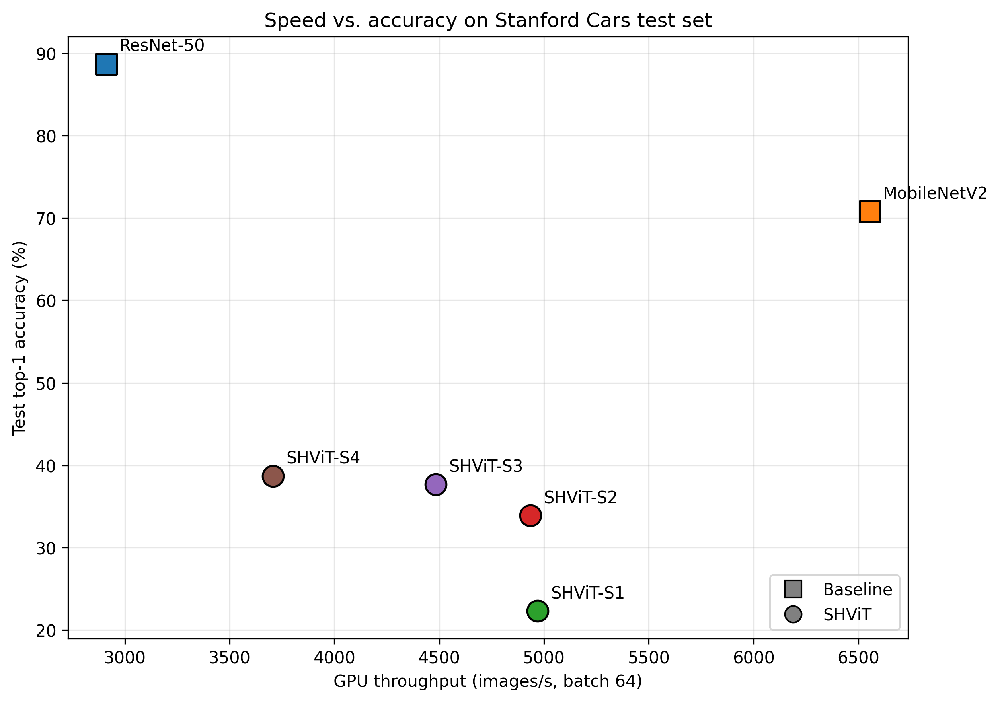

fig_training_curves.png


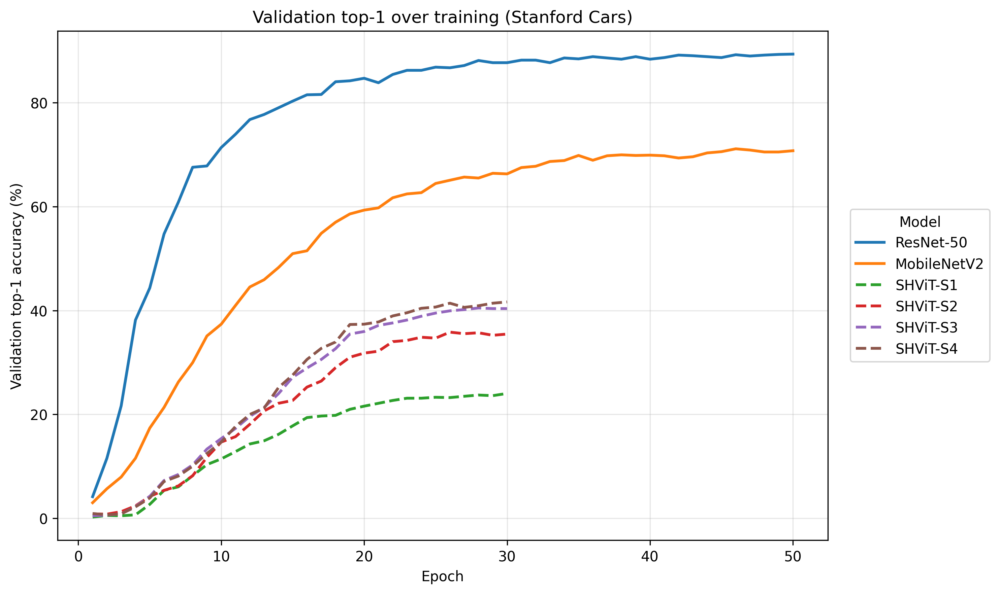

fig_accuracy_bars.png


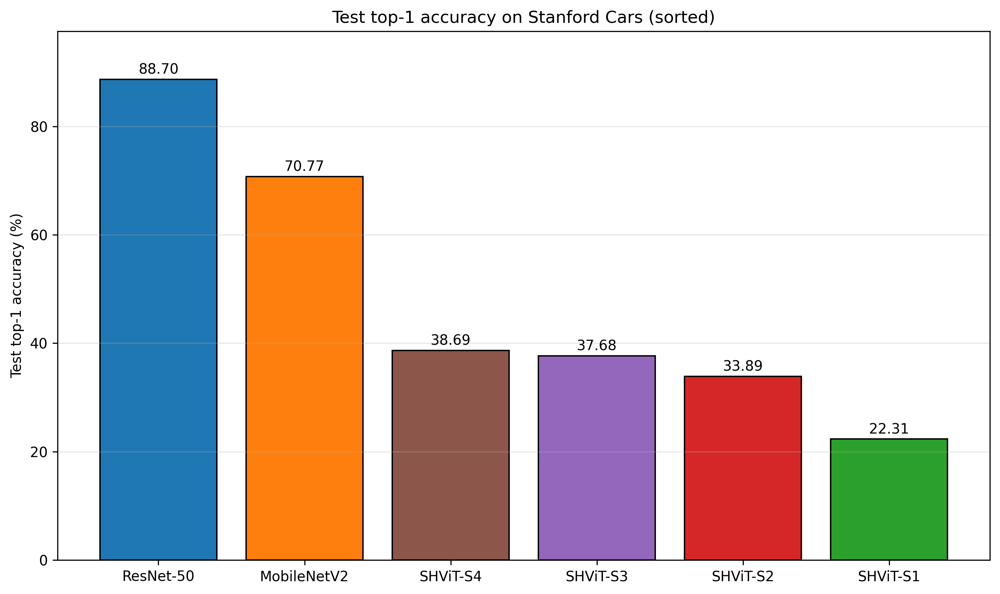

fig_train_loss.png


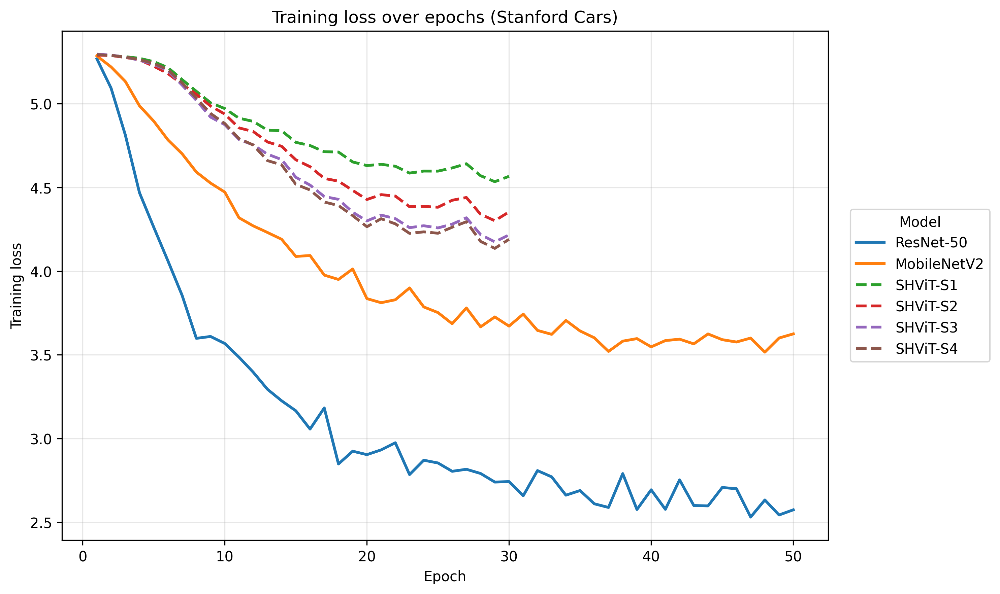

In [11]:
# Inline preview
from IPython.display import Image, display
for f in ['fig_speed_vs_accuracy.png', 'fig_training_curves.png',
          'fig_accuracy_bars.png', 'fig_train_loss.png']:
    p = f'{LOCAL_FIGURES}/{f}'
    if os.path.exists(p):
        print(f)
        display(Image(p, width=700))

## 8. Error analysis on SHViT-S4

Worst-15 categories, top-10 confused class pairs, confusion heatmap, misclassified image grid.

In [12]:
S4_CKPT = f'{STAGE3_LOCAL}/shvit_s4/best.pth'

!python /content/error_analysis.py \
    --results-dir "{LOCAL_RESULTS}" \
    --data-root   {LOCAL_DATA} \
    --shvit-dir   {SHVIT_DIR} \
    --checkpoint  "{S4_CKPT}" \
    --output-dir  "{LOCAL_ERROR}"

print('\nError analysis outputs:')
for f in sorted(os.listdir(LOCAL_ERROR)):
    sz = os.path.getsize(f'{LOCAL_ERROR}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')


[stanford_cars] images already present: /content/stanford_cars_local/stanford_cars
[stanford_cars] split already present: /content/stanford_cars_local/stanford_cars/split_zhou_StanfordCars.json
Reading split from /content/stanford_cars_local/stanford_cars/split_zhou_StanfordCars.json

Worst-10 classes:
  2012 Acura RL Sedan            0.00%
  2012 BMW 3 Series Sedan        0.00%
  2010 BMW M5 Sedan              0.00%
  2007 Chevrolet Express Van     0.00%
  2008 Dodge Magnum Wagon        0.00%
  2007 Ford Mustang Convertible   0.00%
  2012 Mercedes-Benz E-Class Sedan   0.00%
  2012 Honda Accord Sedan        0.00%
  2009 Spyker C8 Coupe           0.00%
  2007 Ford F-150 Regular Cab    2.22%

Best-10 classes:
  2012 FIAT 500 Abarth          96.30%
  2000 AM General Hummer SUV    95.45%
  2007 Dodge Caliber Wagon      95.24%
  1993 Volvo 240 Sedan          93.33%
  2012 Chevrolet Silverado 1500 Regular Cab  90.91%
  1999 Plymouth Neon Coupe      90.91%
  2012 GMC Savana Van           89.7

confusion_top20.png


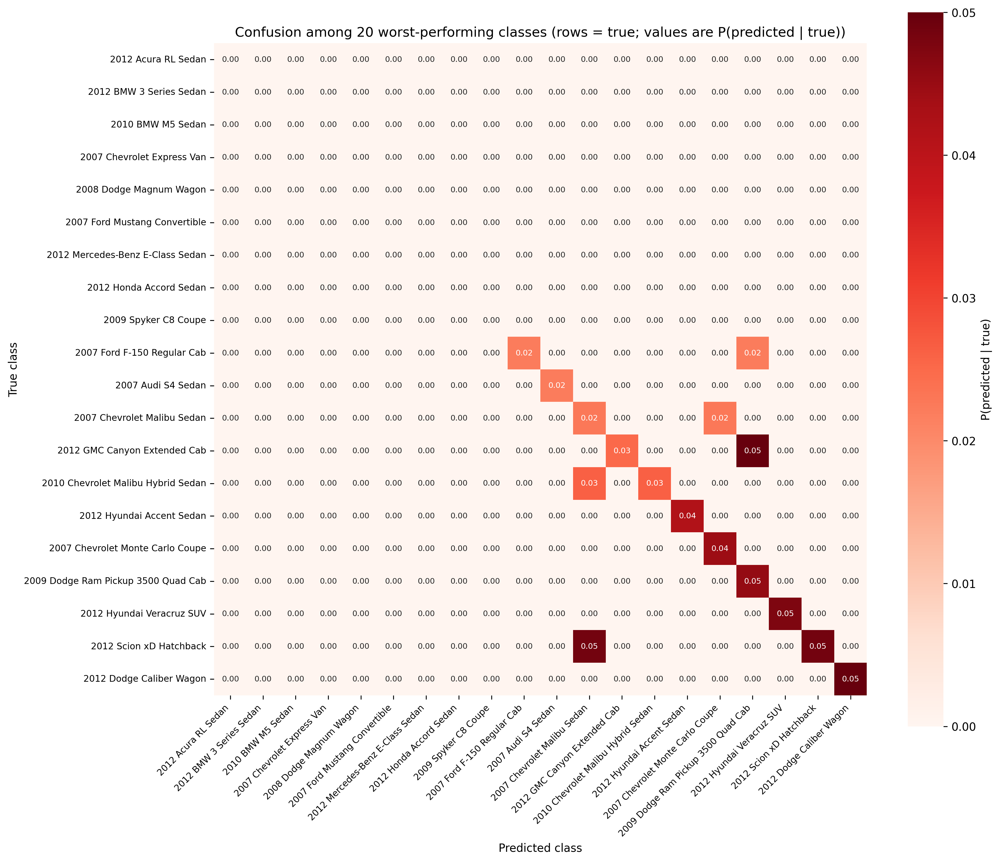

misclassified_grid.png


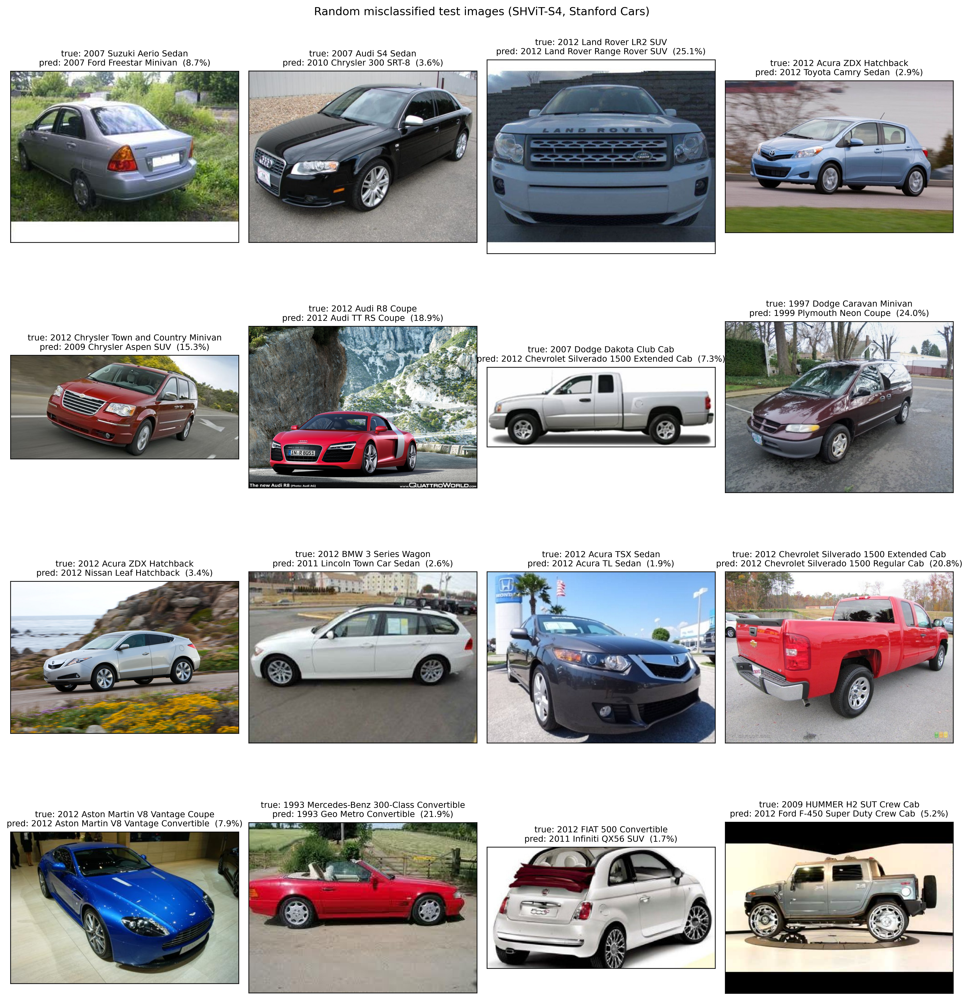

worst_15_categories.png


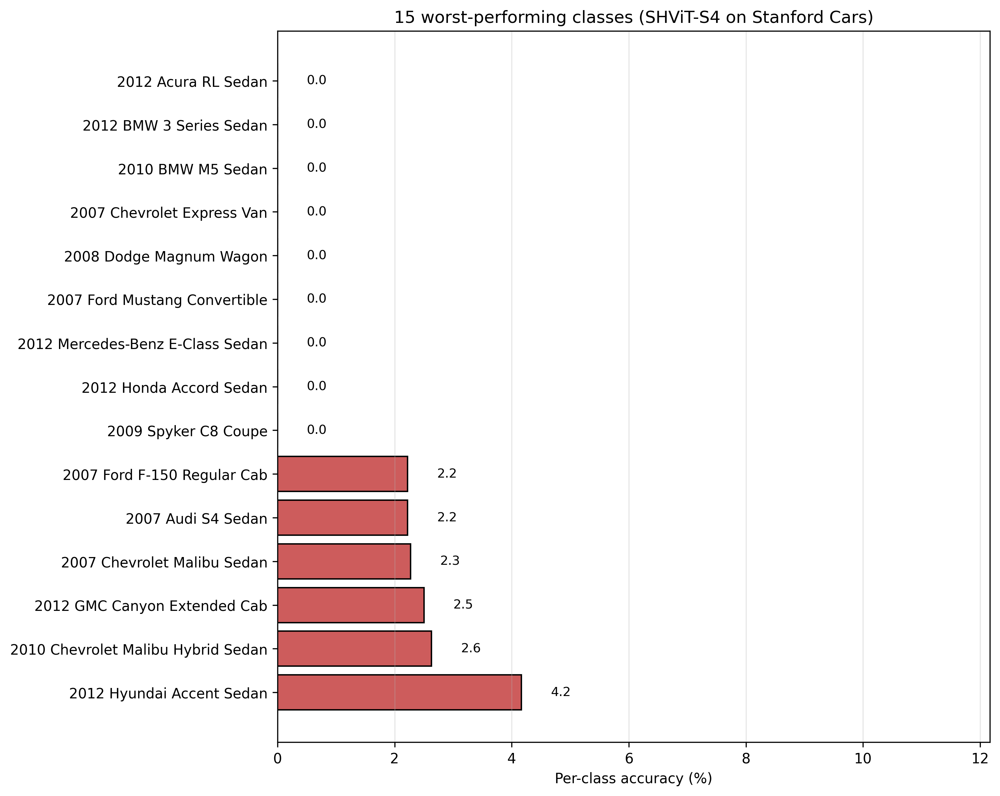

SHViT-S4 Error Analysis Summary (Stanford Cars)

Overall:
  - Test set size       : 8,041 images
  - Test top-1 accuracy : 38.69%
  - Test top-5 accuracy : 73.45%

Worst-10 classes by per-class accuracy:
   1. 2012 Acura RL Sedan            0.00%
   2. 2012 BMW 3 Series Sedan        0.00%
   3. 2010 BMW M5 Sedan              0.00%
   4. 2007 Chevrolet Express Van     0.00%
   5. 2008 Dodge Magnum Wagon        0.00%
   6. 2007 Ford Mustang Convertible   0.00%
   7. 2012 Mercedes-Benz E-Class Sedan   0.00%
   8. 2012 Honda Accord Sedan        0.00%
   9. 2009 Spyker C8 Coupe           0.00%
  10. 2007 Ford F-150 Regular Cab    2.22%

Best-10 classes (for context):
   1. 2012 FIAT 500 Abarth          96.30%
   2. 2000 AM General Hummer SUV    95.45%
   3. 2007 Dodge Caliber Wagon      95.24%
   4. 1993 Volvo 240 Sedan          93.33%
   5. 2012 Chevrolet Silverado 1500 Regular Cab  90.91%
   6. 1999 Plymouth Neon Coupe      90.91%
   7. 2012 GMC Savana Van           89.71%
   8. 2012 Jeep

In [13]:
# Inline preview of error figures + summary text
for f in ['confusion_top20.png', 'misclassified_grid.png', 'worst_15_categories.png']:
    p = f'{LOCAL_ERROR}/{f}'
    if os.path.exists(p):
        print(f)
        display(Image(p, width=700))

summary = f'{LOCAL_ERROR}/error_analysis_summary.txt'
if os.path.exists(summary):
    with open(summary) as f:
        print(f.read())

## 9. Demo on a single image

Smoke test for `demo.py`. By default this grabs the first image from
`stanford_cars/cars_test/`; edit `DEMO_IMAGE` to try any other car.


Using image: /content/stanford_cars_local/stanford_cars/cars_test/00001.jpg
Device: cuda
[stanford_cars] images already present: /content/stanford_cars_local/stanford_cars
[stanford_cars] split already present: /content/stanford_cars_local/stanford_cars/split_zhou_StanfordCars.json
Reading split from /content/stanford_cars_local/stanford_cars/split_zhou_StanfordCars.json

Top-5 predictions for 00001.jpg:
  1. 2007 Ford Freestar Minivan     4.19%
  2. 2011 Lincoln Town Car Sedan    2.28%
  3. 2007 Suzuki Aerio Sedan        2.20%
  4. 1994 Audi 100 Sedan            2.04%
  5. 2007 Chevrolet Malibu Sedan    1.97%

Saved /content/CV_Research_Paper_StanfordCars/Stage 4: Benchmarking and Demo/analysis/demo_output/demo_output.png


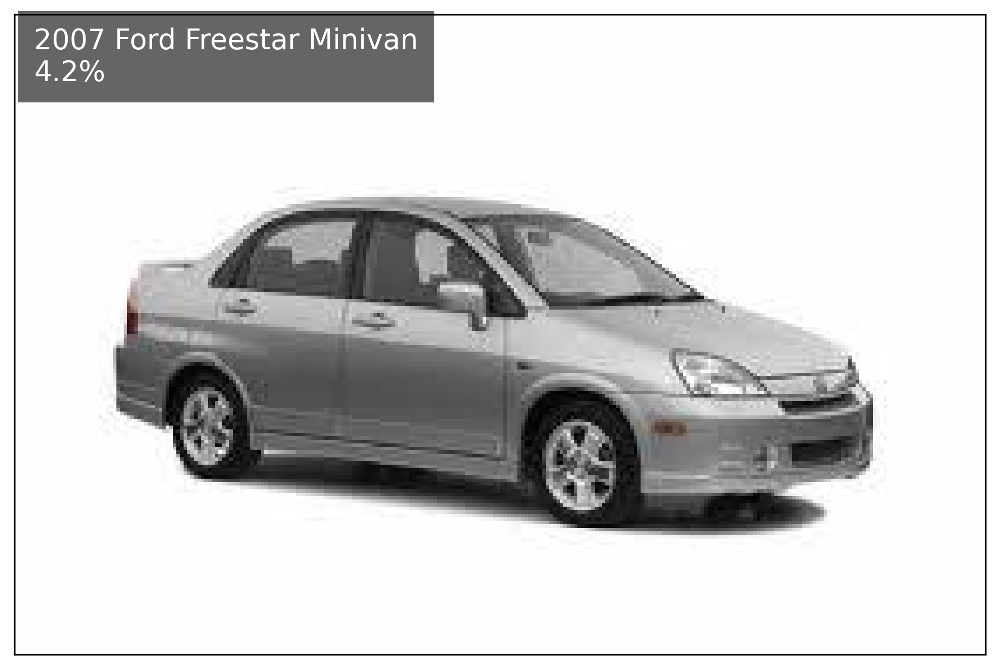

In [14]:
import glob
# Stanford Cars stores images under cars_train/ and cars_test/ (no class subdirs).
candidates = sorted(glob.glob(f'{LOCAL_DATA}/stanford_cars/cars_test/*.jpg'))
DEMO_IMAGE = candidates[0]
print('Using image:', DEMO_IMAGE)

DEMO_OUT = f'{LOCAL_DEMO}/demo_output.png'

!python /content/demo.py \
    --image       "{DEMO_IMAGE}" \
    --checkpoint  "{S4_CKPT}" \
    --shvit-dir   {SHVIT_DIR} \
    --data-root   {LOCAL_DATA} \
    --output      "{DEMO_OUT}"

if os.path.exists(DEMO_OUT):
    display(Image(DEMO_OUT, width=600))


## 10. Bundle everything for download

Zips the entire `<OUT_ROOT>/Stage 4: Benchmarking and Demo/analysis/`
folder so you can download it from the Colab file browser
(right-click `analysis.zip` → Download).


In [15]:
ZIP_PATH = '/content/CV_Research_Paper_StanfordCars_analysis.zip'
if os.path.exists(ZIP_PATH):
    os.remove(ZIP_PATH)

# Zip the analysis subtree (results, figures, EDA, error analysis, demo)
!cd "{ANALYSIS_ROOT}" && zip -rq {ZIP_PATH} \
    results figures eda_outputs error_analysis_outputs demo_output

size_mb = os.path.getsize(ZIP_PATH) / 1e6
print(f'Bundle ready: {ZIP_PATH}  ({size_mb:.1f} MB)')
print('Right-click in the file browser to download.')


Bundle ready: /content/CV_Research_Paper_StanfordCars_analysis.zip  (23.5 MB)
Right-click in the file browser to download.


In [16]:
# Optional: also copy the bundle to Drive for safety
DRIVE_BUNDLE = '/content/drive/MyDrive/CV_Research_Paper_StanfordCars_analysis.zip'
shutil.copy(ZIP_PATH, DRIVE_BUNDLE)
print(f'Also saved to: {DRIVE_BUNDLE}')


Also saved to: /content/drive/MyDrive/CV_Research_Paper_StanfordCars_analysis.zip
